# Capstone Project - EATERY ANALYSIS OF MELBOURNITES 

## Table of contents
* [Introduction: Business Problem](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Analysis](#analysis)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)

## INTRODUCTION : BUSINIESS PROBLEM <a name="introduction"></a>

Eating out is a popular pastime in Australia and we have a huge choice of fabulous cafes, restaurants, pubs and bars in our cities and towns. Therefore, it is very advantageous for investors to set up a food business in Australia.

In this project we will try to find an ideal place to open a restaurant in the Metroplotian Melbourne,Victoria,Australia. This helps the investors to choose a best location to start a business.
Also, this project aims to understand what Melburnians love to eat the most.!

We will use different Data Science techniques for analyzing this problem. 

## Data <a name="data"></a>

To extract/generate the required information the following data sources are need:

* All the **metropolitan restaurants** data are brought in through **Foursquare API** and it is set into a Data frame.

* I've decided to segregate the restaurants data by using the boundaries of **Victorian council areas**, which I found them [here](https://discover.data.vic.gov.au/dataset/lga/resource/66f4bc45-c640-4851-b450-cc060b034376)

Let's import and install all the required libraries.

In [117]:
import pandas as pd
import numpy as np
import requests
import folium
import json
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
from shapely import geometry
from  geopy.geocoders import Nominatim
from pandas.io.json import json_normalize
from sklearn.cluster import KMeans

Now, let us call the restaurants surrounded in and around Metroploitan Melbourne by using **Foursquare API**. 

As, we cannot do the job in a single call, so I grabbed the data by sending request for every suburb and merged them into a **dataframe**.

Depending on the radius settings, when extracting data from Foursquare there is a chance that a venue might appear multiple times. In order to overcome this issue, we decided to drop all duplicates.

In [119]:
CLIENT_ID = 'N3EAWWDUDSR2LMDN0OTH23NLVW1JGZ34BICBZO0XSBNP3QAC' # your Foursquare ID
CLIENT_SECRET = 'W5ASETNEWQKHN22R0ZWANCHDJDMDBWNH4ZVG5XCLYDBDS1PH' # your Foursquare Secret
VERSION = '20180604'
LIMIT = 1000 # Max number of responses we can get in a single request

dataframe = pd.DataFrame()

for i in range(208):
    address = str(3000+i)+', VIC,Australia'
    geolocator = Nominatim(user_agent="foursquare_agent")
    location = geolocator.geocode(address)
    search_query = 'restaurant'
    radius = 5000
    url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&v={}&query={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, location.latitude, location.longitude, VERSION, search_query, radius, LIMIT)
    results = requests.get(url).json()
    try:
        venues = results['response']['venues']
        if dataframe.empty:
            dataframe = json_normalize(venues)
        else:
            dataframe = dataframe.append(json_normalize(venues),ignore_index =True)
    except:
        pass
        
        
    
dataframe.drop_duplicates(subset =['id'],keep ='first', inplace = True)

dataframe.head()

,categories,hasPerk,id,location.address,location.cc,location.city,location.country,location.crossStreet,location.distance,location.formattedAddress,location.labeledLatLngs,location.lat,location.lng,location.neighborhood,location.postalCode,location.state,name,referralId,venuePage.id
0,"[{'id': '4bf58dd8d48988d1f5931735', 'name': 'D...",False,4b05874df964a520318a22e3,203 Little Bourke St,AU,Melbourne,Australia,NaN,259,"[203 Little Bourke St, Melbourne VIC 3000, Aus...","[{'label': 'display', 'lat': -37.8121604733619...",-37.812160,144.966569,NaN,3000,VIC,Dragon Boat Restaurant,v-1596894976,NaN
1,"[{'id': '4bf58dd8d48988d108941735', 'name': 'D...",False,4b1b3210f964a52074f923e3,254 Swanston St.,AU,Melbourne,Australia,NaN,141,"[254 Swanston St., Melbourne VIC 3000, Australia]","[{'label': 'display', 'lat': -37.81199, 'lng':...",-37.811990,144.965210,NaN,3000,VIC,Chinatown Dumpling Restaurant,v-1596894976,NaN
2,"[{'id': '4bf58dd8d48988d145941735', 'name': 'C...",False,4b05874ef964a520c48a22e3,15 Celestial Ave,AU,Melbourne,Australia,at Little Bourke St,231,"[15 Celestial Ave (at Little Bourke St), Melbo...","[{'label': 'display', 'lat': -37.8119108938933...",-37.811911,144.966229,NaN,3000,VIC,Supper Inn Chinese Restaurant,v-1596894976,NaN
3,"[{'id': '4bf58dd8d48988d145941735', 'name': 'C...",False,4b502c8bf964a520fc1d27e3,204 Little Bourke St,AU,Melbourne,Australia,NaN,259,"[204 Little Bourke St, Melbourne VIC 3000, Aus...","[{'label': 'display', 'lat': -37.8120832744199...",-37.812083,144.966566,NaN,3000,VIC,Ling Nam Chinese Restaurant,v-1596894976,NaN
4,"[{'id': '4bf58dd8d48988d113941735', 'name': 'K...",False,4e77090cd4c0934472942be3,400 Lonsdale St,AU,Melbourne,Australia,NaN,260,"[400 Lonsdale St, Melbourne VIC 3000, Australia]","[{'label': 'display', 'lat': -37.8127417950280...",-37.812742,144.960748,NaN,3000,VIC,Yami Yami Korean & Japanese Restaurant,v-1596894976,NaN


In the below cell we are creating a new dataframe, **datafram_filtered** by coping all the features from **dataframe** which we need them for further analysis.

In [120]:
# keep only columns that include venue name, and anything that is associated with location
dataframe_filtered = pd.DataFrame(data = dataframe[['categories','id','location.lat','location.lng','name']]).copy()
dataframe_filtered.head()

,categories,id,location.lat,location.lng,name
0,"[{'id': '4bf58dd8d48988d1f5931735', 'name': 'D...",4b05874df964a520318a22e3,-37.812160,144.966569,Dragon Boat Restaurant
1,"[{'id': '4bf58dd8d48988d108941735', 'name': 'D...",4b1b3210f964a52074f923e3,-37.811990,144.965210,Chinatown Dumpling Restaurant
2,"[{'id': '4bf58dd8d48988d145941735', 'name': 'C...",4b05874ef964a520c48a22e3,-37.811911,144.966229,Supper Inn Chinese Restaurant
3,"[{'id': '4bf58dd8d48988d145941735', 'name': 'C...",4b502c8bf964a520fc1d27e3,-37.812083,144.966566,Ling Nam Chinese Restaurant
4,"[{'id': '4bf58dd8d48988d113941735', 'name': 'K...",4e77090cd4c0934472942be3,-37.812742,144.960748,Yami Yami Korean & Japanese Restaurant


When we look the insights of **dataframe_filtered**, we can see many properties in one of the features, **categories**. From there we extracted a property, **name**(includes cuisisne information) and set it as a new feature.
Also, all the features are scrubbed by keeping their last terms.

In [121]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

# filter the category for each row
dataframe_filtered['categories'] = dataframe_filtered.apply(get_category_type, axis=1)

# clean column names by keeping only last term
dataframe_filtered.columns = [column.split('.')[-1] for column in dataframe_filtered.columns]

dataframe_filtered.reset_index(inplace = True, drop = True)

dataframe_filtered.head()

,categories,id,lat,lng,name
0,Dim Sum Restaurant,4b05874df964a520318a22e3,-37.812160,144.966569,Dragon Boat Restaurant
1,Dumpling Restaurant,4b1b3210f964a52074f923e3,-37.811990,144.965210,Chinatown Dumpling Restaurant
2,Chinese Restaurant,4b05874ef964a520c48a22e3,-37.811911,144.966229,Supper Inn Chinese Restaurant
3,Chinese Restaurant,4b502c8bf964a520fc1d27e3,-37.812083,144.966566,Ling Nam Chinese Restaurant
4,Korean Restaurant,4e77090cd4c0934472942be3,-37.812742,144.960748,Yami Yami Korean & Japanese Restaurant


By using python **Folium** library let us visualize the geographic details of restaurants. I used **latitudes** and **longitudes** to get the visual as below:
 

In [122]:
#print(dataframe_filtered)
location = geolocator.geocode('Melbourne, VIC,Australia')
venues_map = folium.Map(location=[location.latitude, location.longitude], zoom_start=10)

# displaying restaurants as blue circle markers
for lat, lng, label in zip(dataframe_filtered.lat, dataframe_filtered.lng, dataframe_filtered.categories):
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        color='blue',
        popup=label,
        fill = True,
        fill_color='blue',
        fill_opacity=0.6
    ).add_to(venues_map)

# display map
venues_map

This project also aims to understand what Melburnians love to eat the most.!
Inorder to find out that we need a feature, **categories**.let's now copy this feature into another dataframe.

In [123]:
Melb_cuisines = pd.DataFrame(data = dataframe_filtered['categories'].copy())
Melb_cuisines['Count']=""
Melb_cuisines = Melb_cuisines.groupby(['categories'], axis = 0, as_index = True).count()
Melb_cuisines

,Count
categories,
Afghan Restaurant,5
African Restaurant,11
American Restaurant,1
Arcade,1
Asian Restaurant,66
...,...
Vietnamese Restaurant,54
Wine Bar,5
Winery,1


By now, we have got the count of each cuisine. Let us visualize the top **20 Cuisines**, using **Bargraph** and sort them by using **sort_values**.

In [124]:
Melb_cuisines.sort_values(by=['Count'], ascending = False, inplace = True)
Melb_cuisines.head(10)

,Count
categories,
Chinese Restaurant,157
Thai Restaurant,106
Indian Restaurant,101
Restaurant,88
Italian Restaurant,75
Asian Restaurant,66
Japanese Restaurant,63
Vietnamese Restaurant,54
Australian Restaurant,49


In [125]:
def barchart(data, title, ylabel, xlabel):
    data.plot(kind = 'bar', figsize = (10,6),color= ['black', 'blue', 'green', 'red', 'cyan','tomato','chocolate','indigo','lightseagreen'])
    plt.title(title)
    plt.ylabel(ylabel)
    plt.xlabel(xlabel)

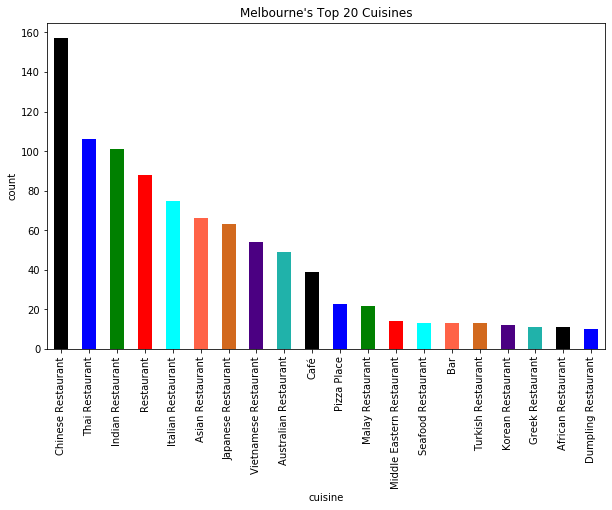

In [126]:
barchart(Melb_cuisines['Count'].iloc[:20],"Melbourne's Top 20 Cuisines","count","cuisine")

By analyzing the above bar graph we can understand that there are many restaurants which did not mentioned the cuisine they serve. So, let us try to identify the cuisines based on the restaurant names.

Similary, if we observe some of the 'Bar & Restaurants' were mentioned as 'Australian Cuisine', where there is no **'Australian Cuisine'**.We can modify and assign them based on their names where ever possible.

In [127]:
# create a new dataframe Melb_cuisines_formated
Melb_cuisines_formated = pd.DataFrame(data = dataframe_filtered[['name','categories']].copy())

In [128]:
def get_bar(row):
    name= str(row['name'])
    if 'Bar'in name:
        category = str(row['categories'])
        if 'Australian' in category:
            return 'Bar'
        elif category.startswith('Restaurant'):
            return 'Bar'
        else:
            return row['categories']
    elif 'Chinese' in name:
        category = str(row['categories'])
        if 'Australian' in category:
            return 'Chinese Restaurant'
        elif category.startswith('Restaurant'):
            return 'Chinese Restaurant'
        else:
            return row['categories']
    elif 'Indian' in name:
        category = str(row['categories'])
        if 'Australian' in category:
            return 'Indian Restaurant'
        elif category.startswith('Restaurant'):
            return 'Indian Restaurant'
        else:
               return row['categories']
    elif 'Thai' in name:
        category = str(row['categories'])
        if 'Australian' in category:
            return 'Thai Restaurant'
        elif category.startswith('Restaurant'):
            return 'Thai Restaurant'
        else:
            return row['categories']
    elif 'Italian' in name:
        category = str(row['categories'])
        if 'Australian' in category:
            return 'Italian Restaurant'
        elif category.startswith('Restaurant'):
            return 'Italian Restaurant'
        else:
            return row['categories']
    else:
        return row['categories']

In [129]:
Melb_cuisines_formated['categories'] = Melb_cuisines_formated.apply(get_bar, axis = 1)
Melb_cuisines_formated.drop(['name'], axis = 1, inplace = True)
Melb_cuisines_formated

,categories
0,Dim Sum Restaurant
1,Dumpling Restaurant
2,Chinese Restaurant
3,Chinese Restaurant
4,Korean Restaurant
...,...
1147,Asian Restaurant
1148,Japanese Restaurant
1149,Asian Restaurant
1150,Italian Restaurant


Now, let's groupby the **Melb_cuisines_formated** by **cateories** and sort the values. 

In [130]:
Melb_cuisines_formated['Total']=""
Melb_cuisines_formated = Melb_cuisines_formated.groupby(['categories'], axis = 0, as_index = True).count()
Melb_cuisines_formated.sort_values(by=['Total'], ascending = False, inplace = True)
Melb_cuisines_formated

,Total
categories,
Chinese Restaurant,159
Thai Restaurant,107
Indian Restaurant,106
Italian Restaurant,75
Restaurant,66
...,...
Hookah Bar,1
Scandinavian Restaurant,1
Scenic Lookout,1


In [153]:
Melb_cuisines_formated.head(10)

,Total
categories,
Chinese Restaurant,159
Thai Restaurant,107
Indian Restaurant,106
Italian Restaurant,75
Restaurant,66
Asian Restaurant,66
Japanese Restaurant,63
Vietnamese Restaurant,54
Café,39


After reclassification, a drop in number of unknown cuisines is observed. Below is the bar chart after reclassification.

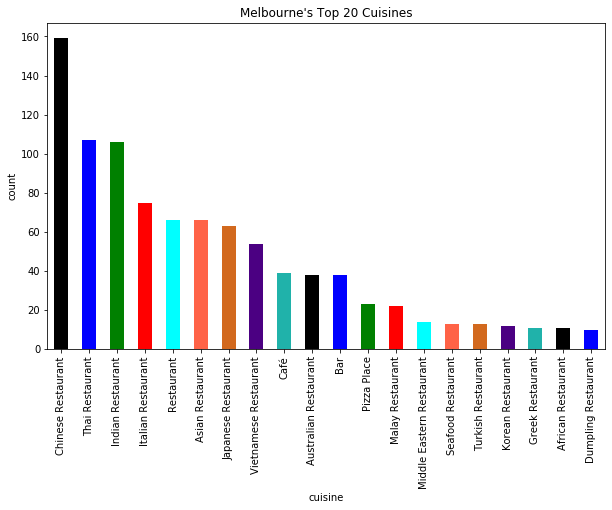

In [154]:
barchart(Melb_cuisines_formated['Total'].iloc[:20],"Melbourne's Top 20 Cuisines","count","cuisine")

Let's visualize the **top 5 cuisines**.

In [132]:
def piechart(data,legend_labels,title,axis,explode):
    data.plot(kind = 'pie', figsize = (13,6), autopct = '%1.1f%%', startangle = 90, shadow = True,explode = explode, labels = None)
    plt.title(title)
    plt.axis(axis)
    plt.legend(labels = legend_labels,loc ='upper left')
    plt.show()

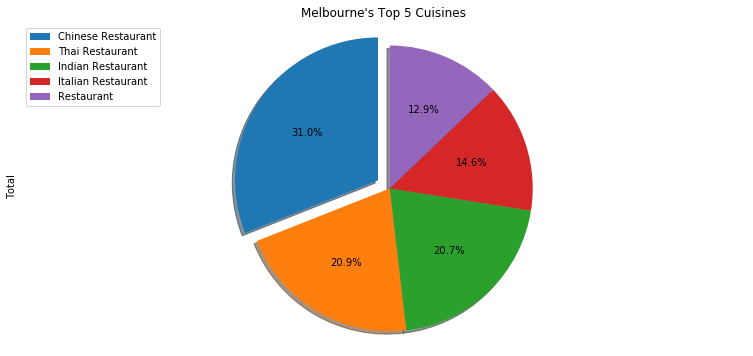

In [133]:
explode = (0.1, 0, 0, 0, 0)
piechart(Melb_cuisines_formated['Total'].iloc[:5],Melb_cuisines_formated.index,"Melbourne's Top 5 Cuisines","equal",explode)

If we compare the above piechart and bar graph, we can clearly state that the generalised cuisine **Restaurant** were modified by their names.so, it did not appear any where in the top **5 Cuisines**.
After reclassification, we can observe there is a slight increase in the percentage share of every cuisine.

Till this point we've wrangled and visualized the restaurants dataframe but for analyzing the ideal location for setting up a restaurant we need coordinates of the **Metropolitan Melbourne**.

As it is already mentioned early, the boundaries of **Victorian Council areas** were brought in and they are changed into a drataframe **df** from **geojson** format.

In [134]:
data = json.load(open('/Users/ashu/Desktop/LGA.geojson'))
df = pd.DataFrame(data["features"])
df['poly']=""

In [135]:
df.head()

,type,properties,geometry,poly
0,Feature,"{'OBJECTID_1': 1, 'OBJECTID': 408, 'COLOR': 1,...","{'type': 'Polygon', 'coordinates': [[[141.0021...",
1,Feature,"{'OBJECTID_1': 2, 'OBJECTID': 409, 'COLOR': 4,...","{'type': 'Polygon', 'coordinates': [[[142.7785...",
2,Feature,"{'OBJECTID_1': 3, 'OBJECTID': 410, 'COLOR': 2,...","{'type': 'Polygon', 'coordinates': [[[142.6285...",
3,Feature,"{'OBJECTID_1': 4, 'OBJECTID': 411, 'COLOR': 3,...","{'type': 'Polygon', 'coordinates': [[[142.3646...",
4,Feature,"{'OBJECTID_1': 5, 'OBJECTID': 412, 'COLOR': 3,...","{'type': 'Polygon', 'coordinates': [[[143.8219...",


If we dig deep into the dataframe **df**we can see that **geometry** has some properties in it and similary the feature **properties** has some properties inside them. From here we extracted **coordinates** and **SH_Name**(Council name) and are set as new Features.

In [136]:
def get_coordinates(row):
    return row['geometry']['coordinates']
def get_name(row):
    return row['properties']['SH_NAME']

df['coordinates'] = df.apply(get_coordinates, axis=1)
df['name'] = df.apply(get_name, axis=1)
df.head()

,type,properties,geometry,poly,coordinates,name
0,Feature,"{'OBJECTID_1': 1, 'OBJECTID': 408, 'COLOR': 1,...","{'type': 'Polygon', 'coordinates': [[[141.0021...",,"[[[141.002137742876, -34.0366403577168], [141....",RURAL CITY OF MILDURA
1,Feature,"{'OBJECTID_1': 2, 'OBJECTID': 409, 'COLOR': 4,...","{'type': 'Polygon', 'coordinates': [[[142.7785...",,"[[[142.778522560044, -34.5789743312784], [142....",RURAL CITY OF SWAN HILL
2,Feature,"{'OBJECTID_1': 3, 'OBJECTID': 410, 'COLOR': 2,...","{'type': 'Polygon', 'coordinates': [[[142.6285...",,"[[[142.628517991383, -35.1931604512382], [142....",SHIRE OF BULOKE
3,Feature,"{'OBJECTID_1': 4, 'OBJECTID': 411, 'COLOR': 3,...","{'type': 'Polygon', 'coordinates': [[[142.3646...",,"[[[142.364679871116, -35.2924258662977], [142....",SHIRE OF YARRIAMBIACK
4,Feature,"{'OBJECTID_1': 5, 'OBJECTID': 412, 'COLOR': 3,...","{'type': 'Polygon', 'coordinates': [[[143.8219...",,"[[[143.821949037045, -35.4459063009119], [143....",SHIRE OF GANNAWARRA


Using **Shapely** library, we should reconstruct the polygon for each council area.
Because, the restaurant dataframe didn't provide any council area information, but has provided **latitude** and **longitude** values. Using these values,we need to find the council area of restaurants.

In [137]:
points_list=[]
for i in range(df.shape[0]):
    try:
        points = df.iloc[i,4][0]
        points_list.clear()
        for j in range(len(df.iloc[i,4][0])):
            point_data = df.iloc[i,4][0][j]
            points_list.append(geometry.Point(point_data[0],point_data[1]))  
        df.iloc[i,3]= geometry.Polygon([[p.x,p.y] for p in points_list])
    except:
        pass

In [138]:
def find_Councilarea(row):
    point = geometry.Point(row['lng'],row['lat'])
    for i in range(df.shape[0]):
        try: 
            if(df.iloc[i,3].contains(point)):
                return df.iloc[i,5]
        except:
            pass

dataframe_filtered['Councilarea'] = dataframe_filtered.apply(find_Councilarea,axis=1)
dataframe_filtered.head()

,categories,id,lat,lng,name,Councilarea
0,Dim Sum Restaurant,4b05874df964a520318a22e3,-37.812160,144.966569,Dragon Boat Restaurant,CITY OF MELBOURNE
1,Dumpling Restaurant,4b1b3210f964a52074f923e3,-37.811990,144.965210,Chinatown Dumpling Restaurant,CITY OF MELBOURNE
2,Chinese Restaurant,4b05874ef964a520c48a22e3,-37.811911,144.966229,Supper Inn Chinese Restaurant,CITY OF MELBOURNE
3,Chinese Restaurant,4b502c8bf964a520fc1d27e3,-37.812083,144.966566,Ling Nam Chinese Restaurant,CITY OF MELBOURNE
4,Korean Restaurant,4e77090cd4c0934472942be3,-37.812742,144.960748,Yami Yami Korean & Japanese Restaurant,CITY OF MELBOURNE


In [139]:
dataframe_filtered

,categories,id,lat,lng,name,Councilarea
0,Dim Sum Restaurant,4b05874df964a520318a22e3,-37.812160,144.966569,Dragon Boat Restaurant,CITY OF MELBOURNE
1,Dumpling Restaurant,4b1b3210f964a52074f923e3,-37.811990,144.965210,Chinatown Dumpling Restaurant,CITY OF MELBOURNE
2,Chinese Restaurant,4b05874ef964a520c48a22e3,-37.811911,144.966229,Supper Inn Chinese Restaurant,CITY OF MELBOURNE
3,Chinese Restaurant,4b502c8bf964a520fc1d27e3,-37.812083,144.966566,Ling Nam Chinese Restaurant,CITY OF MELBOURNE
4,Korean Restaurant,4e77090cd4c0934472942be3,-37.812742,144.960748,Yami Yami Korean & Japanese Restaurant,CITY OF MELBOURNE
...,...,...,...,...,...,...
1147,Asian Restaurant,4f49eac2e4b093da13279669,-38.153490,145.185540,Delight Inn Malaysian & Chinese Restaurant,CITY OF FRANKSTON
1148,Japanese Restaurant,5e60a54ffd0227000703987b,-38.115608,145.240721,Okami Japanese Restaurant,CITY OF CASEY
1149,Asian Restaurant,4bdab05d3904a5936306479e,-37.910750,145.037160,Silver Dragon,CITY OF GLEN EIRA
1150,Italian Restaurant,5718ba24498e88a3a859dce1,-37.849413,144.961717,Torsca italian restaurant,CITY OF PORT PHILLIP


In [140]:
dataframe_filtered['Total'] =""
temp = dataframe_filtered.groupby(["Councilarea","categories"],axis=0,as_index = False).count().sort_values(['Total'],ascending=False)
temp.head()

,Councilarea,categories,id,lat,lng,name,Total
264,CITY OF MONASH,Chinese Restaurant,23,23,23,23,23
367,CITY OF WHITEHORSE,Chinese Restaurant,21,21,21,21,21
238,CITY OF MELBOURNE,Italian Restaurant,17,17,17,17,17
231,CITY OF MELBOURNE,Chinese Restaurant,15,15,15,15,15
251,CITY OF MELBOURNE,Restaurant,14,14,14,14,14


To find the centroids of council areas, we need to copy **Councilarea** into another dataframe **Marker_data.**

In [158]:
Marker_data = pd.DataFrame(temp['Councilarea'].unique())
Marker_data.columns=["Councilarea"]
Marker_data["latitude"] = ""

In [159]:
def find_latitude(row):
    try:
        return df.loc[lambda df: df['name'] == row['Councilarea']]['poly'].iloc[0].centroid.y
    except:
        pass

def find_longitude(row):
    try:
        return df.loc[lambda df: df['name'] == row['Councilarea']]['poly'].iloc[0].centroid.x
    except:
        pass

In [160]:
Marker_data['latitude'] = Marker_data.apply(find_latitude,axis=1)
Marker_data['longitude'] = Marker_data.apply(find_longitude,axis=1)

## Methodology <a name="methodology"></a>

In this project we are trying to identify the best locations for setting up a new restaurant in the **Metropolitan Melbourne.** 

First step we have collected the data of restaurants using **Foursquare API**, as we cannot make it in a single call we have to do it for every suburb and merge the data.

Second step we bring in all the required features into another dataframe 
and the properties of a column are set into new a feature for further analysis, also the last terms of the features will be kept as it is and rest of the things should be ditached. 
After all these a map will be drawn using **Folium** library to visualize the geographic details of restaurants.

Third step we copied a feature **categories** into another dataframe to analyze what **Melburnians love to eat the most.!** For this **categories** are grouped and sorted. Finally visualize it with a barchart.
Barchart makes us understand that there are some restaturants who didn't mention the cuisines they serve.

Step four is identifying the cuisines based on the restaurant names and finally figuring out the top **5 Cuisines** of the Metropolitan region.

Fifth step bring in **Victorian Council area boundaries** and set into a dataframe as it was in geojson format. we need to make some of the properties of features into new features as we did for the restaurant dataframe.Now, by using the library **Shapely** we have to reconstrut the polygon for each council area, as the restaurants did not provide any council area but has latitide and longitude values.

Using **latitudes** and **longitudes**, council areas will be mapped.

## Analysis <a name="analysis"></a>

By now the data is set and ready to perform analysis.We have some common cuisine categories in council areas, so for this reason we use **K-means algorithm** to cluster the council areas. 

**K-means algorithm** is one of the most common cluster method of **unsupervised learning.**

Analyze the **k-means** with **elbow** method to ensure the optimum **K.** 

In [161]:
distortions = []
K = range(1,9)
clustering_data = pd.DataFrame(data = Marker_data[['latitude','longitude']].copy())
for k in K:
    kmeans = KMeans(n_clusters = k,random_state=0).fit(clustering_data)
    distortions.append(kmeans.inertia_)

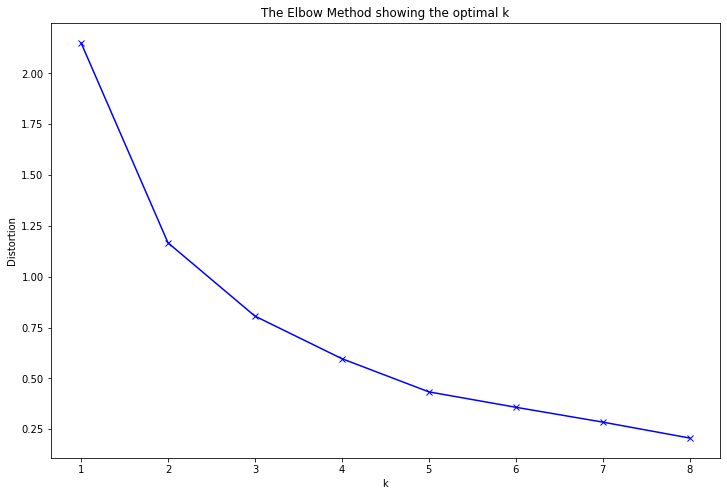

In [162]:
plt.figure(figsize=(12,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

**Elbow** method ensured degree **4** as optimum **K**. Run **K-Means** to cluster the council areas into **4** clusters.

In [163]:
k=4
kmeans = KMeans(n_clusters = k,random_state=0).fit(clustering_data)
kmeans.labels_
Marker_data.insert(0, 'Cluster Labels', kmeans.labels_)

Now let us assign **Cluster Labels** to their respective **councils.**

In [164]:
def cluster(row):
     try:
        return Marker_data.loc[lambda Marker_data: Marker_data['Councilarea'] == row['Councilarea']]['Cluster Labels'].iloc[0]   
     except:
        pass

In [165]:
dataframe_filtered['cluster_labels'] = ""
dataframe_filtered['cluster_labels'] = dataframe_filtered.apply(cluster, axis=1)

Based on the clusters we can estimate what is the most common venue. Thus, we can create a **Bar chart** which can help us to find the proper labels for each cluster.

In [166]:
def find_top(row):
    return temp[temp['Councilarea'].str.match(row['Councilarea'])].reset_index(drop =True).truncate(after=0,axis=0)[['categories','Total']].values.tolist()[0][0]

Marker_data['Most common'] = Marker_data.apply(find_top, axis=1)

clusters = pd.DataFrame(data = Marker_data[['Most common','Cluster Labels']].copy())
clusters[''] = ""
count = clusters.groupby(['Most common','Cluster Labels'], axis = 0, as_index = False).count()
count1 = count.pivot(index = 'Cluster Labels',columns='Most common').rename_axis(None)
count1.columns = [' '.join(col).strip() for col in count1.columns.values]

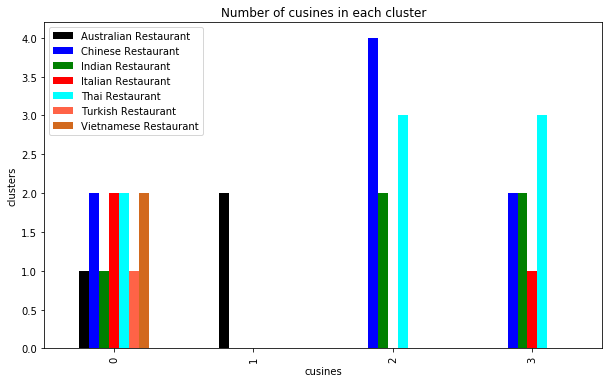

In [167]:
  
barchart(count1,"Number of cusines in each cluster","clusters","cusines")

Let's find the **top 3 cuisines** for each **Council area.**

In [168]:
def find_top3(row):
    top_list = temp[temp['Councilarea'].str.match(row['Councilarea'])].reset_index(drop =True).truncate(after=2,axis=0)[['categories','Total']].values.tolist()
    label = "Cluster : "
    label+= str(Marker_data.loc[lambda Marker_data: Marker_data['Councilarea'] == row['Councilarea']]['Cluster Labels'].iloc[0] )  
    label+= ",Top 3 restaurants : "
    for i in range(len(top_list)):
        label+= (str(top_list[i][0])+" = "+str(top_list[i][1]))
        if(i<2):
            label+=','
    return label

Marker_data['label'] = Marker_data.apply(find_top3,axis=1)

Visualizing a **Choropleth map** with the below information:
* **Cluster reference.**
* **Top 3 Cuisines.**
* **No of restaurants.**


In [169]:
vic_map = folium.Map(location = [-37.840935,144.946457], zoom_start = 9, tiles = 'Mapbox Bright')

vic_map.choropleth(
    geo_data= '/Users/ashu/Desktop/LGA.geojson',
    data = dataframe_filtered.groupby(["Councilarea"],axis=0,as_index = False).count(),
    columns=['Councilarea', 'Total'],
    key_on = 'feature.properties.SH_NAME',
    nan_fill_color = 'white',
    nan_fill_opacity = 0.1,
    fill_color = 'GnBu',
    fill_opacity = 0.7,
    line_opacity=0.2,
    legend_name='Restaurants in Vic Council areas'
)

x = np.arange(k)
ys = [i + x + (i*x)**2 for i in range(k)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = ['limegreen','midnightblue','firebrick','goldenrod']


for lat, lng, label,cluster in zip(Marker_data.latitude, Marker_data.longitude, Marker_data.label,Marker_data['Cluster Labels']):
    folium.CircleMarker(
        [lat, lng],
        radius=4,
        color=rainbow[cluster-1],
        popup=folium.Popup(label, max_width = 500,min_width = 500),
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=1
    ).add_to(vic_map)

# display map
vic_map




/Users/administrator/opt/anaconda3/lib/python3.7/site-packages/folium/folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


Looking good!The above **choropleth map** helps the users to understand how many restaurants are there in each **council area.** 
Also, it indicates what are the top **3 cuisines.** 

## Results and Discussion <a name="results"></a>

This case study was done to find the proper and best locations for investors to set up a new business. All the restaurants data were brought in through **Foursquare API** and restaurants were segregated by using **Victorian council boundaries**.

A lot of wrangling was done on Master data and a clean dataframe was set for prediction. On piecharting the data, we analyzed the top 5 cuisines. This also helps us to understand which cuisines Melbournites enamour the most.
Using **Elbow** method we divided the restaurants(categories) into 4 clusters for easy understanding and analyzing.And the top 3 restaurants for every cluster was displayed in the choropleth map.
**Folium** was used for visualizing the map, from these results we can say there are many restaurants in down town when compared.

The second cluster says it all! Because there were very few restaurants located which helps the investors to choose a location for their business.

As a note,we would like to tell the audience! <br>                         since we called the data from **Foursquare API** we got very few restaurants data which is approximately around 1,100. In future if more data is available this case study may provide better and accurate predictions.

## Conclusion <a name= "conclusion"></a>

The purpose of this project is to forecast the best locations for investors, who is settingup a new business in Metropolitan Melbourne.<br>
Our analysis shows that there are a great variety of restaurants. Most of the restaurants are located in **CBD**.
If we move from **CBD**, the count of restaurants decreased gradually, which helps the investors to find their best place for setting up a business.<br>
As per our analysis, it may be beneficiary for investors to set up business in the second cluster i.e. **Cluster 1**, because there are very few restaurants in that cluster as when compared to other clusters.
This case study also tells us the top cuisines which Melburnians like the most.<br>
Investor may see good profits if they invest in setting a 'Chinese', 'Thai' or 'Indian' restaurants.